##**Overview**

This problem consists of the following 4 parts. By completing these parts, you will develop code that will automatically create a composite image from several overlapping images. Each part has equal weight in grading.

a) 2D homography

b) Image warping

c) RANSAC using SIFT keypoints

d) Image stitching

# Environment setup

In [52]:
# Mount your Google Drive to this notebook
# The purpose is to allow your code to access to your files
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [53]:
# Change the directory to your own working directory
# Any files under your working directory are available to your code
# TO DO: enter the name of your directory
import os
os.chdir('/content/drive/MyDrive/ECE5554_Fall2021/Homework3')


In [98]:
# The following is needed to allow the use of SIFT 
# (need OpenCV version 4.5 or later)
# For a new installation, you may see a message:
#  "You must restart the runtime in order to use newly installed versions." 
#  One way to do this is to click "Runtime" -> "Restart Runtime"
# If you see an error message, you may need to run this step again, after running the "Import" block that follows
!pip install opencv-python==4.5.3.*

In [54]:
# Import library modules
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt
# PIL is the Python Imaging Library
from PIL import Image  
# The following is a substitute for cv2.imshow, which Colab does not allow
from google.colab.patches import cv2_imshow

print('Python version:', sys.version)
print('OpenCV version:', cv2.__version__)
print('NumPy version: ', np.__version__)


Python version: 3.7.12 (default, Sep 10 2021, 00:21:48) 
[GCC 7.5.0]
OpenCV version: 4.5.3
NumPy version:  1.19.5


#Getting started

Several image files were provided to you (Newman*.png, mandrill.tif, Rubiks_cube.jpg). Upload all of them to your working directory.

The following functions are helpful for loading images into floating-point format, and for displaying images that are in that format.  Let's use those functions to visualize 3 separate images that we want to stitch together. Notice that you can adjust the size of the figure that is displayed.


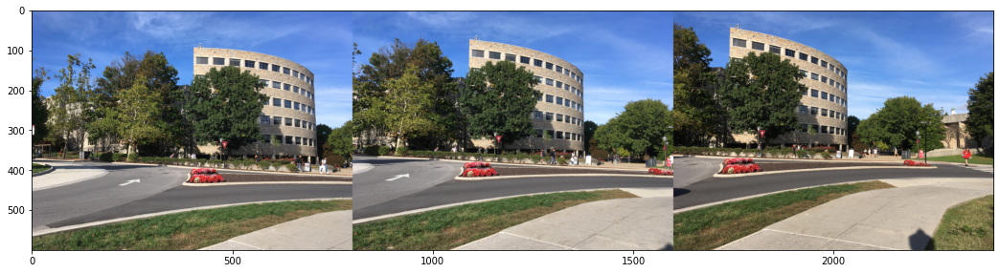

In [55]:
def load_image(filename):
  img = np.asarray(Image.open(filename))
  img = img.astype("float32")/255.0
  return img

def show_image(img):
  fig = plt.figure()
  fig.set_size_inches(18, 10) # You can adjust the size of the displayed figure
  plt.imshow(img)

left_img = load_image("Newman1.png")
center_img = load_image("Newman2.png")
right_img = load_image("Newman3.png")
show_image(np.concatenate([left_img, center_img, right_img], axis=1))

Next, verify that you can use OpenCV tools to detect SIFT-based keypoints. These library functions allow for many options. For example, if you change the `nfeatures` parameter for `SIFT_create`, you'll see different numbers of detected keypoints. You may want to experiment with these parameters later.

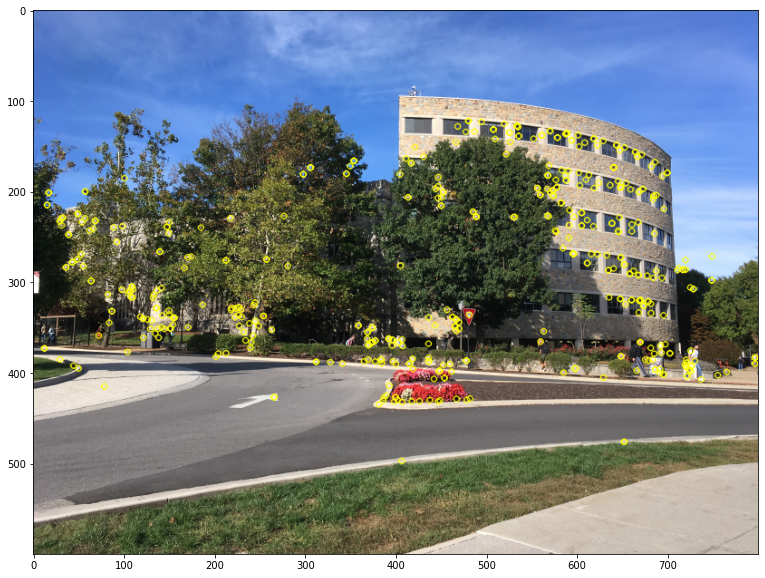

In [56]:
def testSIFT(img1):
  sift = cv2.SIFT_create(nfeatures=500)
  kp = sift.detect(img1, None)
  img1=cv2.drawKeypoints(img1, kp, None, color=(0, 255, 255))
  
  fig = plt.figure()
  fig.set_size_inches(18,10) # You can adjust the size of the displayed figure
  plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))


img = cv2.imread("Newman1.png", cv2.IMREAD_COLOR)
testSIFT(img)

#Part (a):  2D homography

Implement the 2 functions that are shown in the next code block. (OpenCV has a findHomography() function, and other related functions, but for this assignment you must write your own version.)

1.   **compute_homography(src, dst)** receives two matrices, each of size Nx2. Each matrix contains N two-dimensional points. For each value of i, src[i] and dst[i] are corresponding points from two different images. The function should return the homography matrix H of size 3x3 that maps every point from the source (src) to the destination (dst).   Guidance: You may assume that N is at least 4. You can set up the problem in a matrix-based, least-squares format. (A somewhat similar problem is in the lecture slides on page 40 of packet 5.) Helpful functions are `np.linalg.eig()` and `np.linalg.eigh()` for computing eigenvalues and eigenvectors. The latter function will prevent warnings due to small imaginary values if you are working with matrices that are real and symmetric. 
2.   **apply_homography(src, H)** receives points in matrix src (an Nx2 matrix), and a homography transformation H (a 3x3 matrix). This function should use the homography matrix to transform each point in src to a new destination point. Store the resulting points in matrix dst, which is the same size as src. The function should return dst. Guidance: remember to use homogeneous coordinates when implementing this transformation.



In [67]:
def compute_homography(src, dst):
  '''Computes the homography from src to dst.
   Input:
    src: source points, shape (N, 2), where N >= 4
    dst: destination points, shape (N, 2)
   Output:
    H: homography from source points to destination points, shape (3, 3)

   TO DO: Implement the compute_homography function
  '''
  # The following line is just a place-holder
  # A = []
  # H = np.matrix('1, 0, 0; 0, 1, 0; 0, 0, 1')
  # for i in range(len(src)):
  #   x, y = src[i,0], src[i,1]
  #   u, v = dst[i,0], dst[i,1]
  #   A.append([x, y, 1, 0, 0, 0, -u * x, -u * y, -u])
  #   A.append([0, 0, 0, x, y, 1, -v * x, -v * y, -v])
  # A = np.asarray(A)

  # U, S, Vh = np.linalg.svd(A)
  # L = Vh[-1, :] / Vh[-1, -1]
  # h1 = L.reshape(3, 3)
  A = []
  H = np.matrix('1, 0, 0; 0, 1, 0; 0, 0, 1')
  for i in range(len(src)):
      x, y = src[i,0], src[i,1]
      u, v = dst[i,0], dst[i,1]
      A.append([x, y, 1, 0, 0, 0, -u * x, -u * y, -u])
      A.append([0, 0, 0, x, y, 1, -v * x, -v * y, -v])
  A = np.asarray(A)
  B = np.matmul(np.transpose(A) , A)
  eigen_value, eigen_vector = np.linalg.eig(B)
  min_eigen_value = np.amin(eigen_value) 
  for i in range(len(eigen_value)):
        if(eigen_value[i] == min_eigen_value):
              minimum_pos = i
  H = eigen_vector[:,minimum_pos].reshape(3,3)
  H = H/H[2,2]
    
    
  return H


def apply_homography(src, H):

  '''Applies a homography H to the source points.
   Input:
      src: source points, shape (N, 2)
      H: homography from source points to destination points, shape (3, 3)
   Output:
     dst: destination points, shape (N, 2)

   TO DO: Implement the apply_homography function
  '''
  dst_output = []
 
  dst = np.zeros([src.shape[0], 2])
  N = src.shape[0]
  a = np.array([N*[1]])
  a = a.reshape((N,1))
  src1 = np.append(src, a, axis = 1)
  for i in range(len(src)):
    mapped_points = np.matmul(H, np.transpose(src1[i]))
    dst_output.append(mapped_points[0]/mapped_points[2])
    dst_output.append(mapped_points[1]/mapped_points[2])
  dst_output = np.asarray(dst_output)
  dst = np.copy(dst_output)
  dst= dst.reshape(N,2)
  
  return dst

You do not need to change the following function. It will test your homography code, and should help you in debugging. Corresponding points are placed in src_pts and dst_pts. If your homography code is correct, it should map the points given in test_pts to locations that are close to the points given in match_pts_correct. If you have correctly implemented compute_homography() and apply_homography(), then the printed difference values should be close to 0. (A small difference, such as 0.001, should be acceptable.)

In [68]:
def test_homography():
  src_pts = np.matrix('0, 0; 1, 0; 1, 1; 0, 1')
  dst_pts = np.matrix('5, 4; 7, 4; 7, 5; 6, 6')
  H = compute_homography(src_pts, dst_pts)
  test_pts = np.matrix('0,  0; 1, 0; 1, 1; 0, 1')
  match_pts = apply_homography(test_pts, H)
  match_pts_correct = np.matrix('5, 4; 7, 4; 7, 5; 6, 6')
  print('Your 1st solution differs from our solution by: %f'
    % np.square(match_pts - match_pts_correct).sum())
  
  src_pts = np.matrix('0, 0; 1, 0; 1, 1; 0, 1; 2, 3')
  dst_pts = np.matrix('5, 4; 7, 4; 7, 5; 6, 6; 7.25, 5.5')
  H = compute_homography(src_pts, dst_pts)
  test_pts = np.matrix('0,  0; 1, 0; 1, 1; 0, 1')
  match_pts = apply_homography(test_pts, H)
  match_pts_correct = np.matrix('5, 4; 7, 4; 7, 5; 6, 6')
  print('Your 2nd solution differs from our solution by: %f'
    % np.square(match_pts - match_pts_correct).sum())
  
  src_pts = np.matrix('347, 313; 502, 341; 386, 571; 621, 508')
  dst_pts = np.matrix('274, 286; 436, 305; 305, 527; 615, 506')
  H = compute_homography(src_pts, dst_pts)
  test_pts = np.matrix('259, 505; 350, 371; 400, 675; 636, 104')
  match_pts = apply_homography(test_pts, H)
  match_pts_correct = np.matrix('195.13761083, 448.12645033;'
    '275.27269386, 336.54819916;'
    '317.37663747, 636.78403426;'
    '618.50438823, 28.78963905')
  print('Your 3rd solution differs from our solution by: %f'
    % np.square(match_pts - match_pts_correct).sum())
  
test_homography()

Your 1st solution differs from our solution by: 0.000000
Your 2nd solution differs from our solution by: 0.000000
Your 3rd solution differs from our solution by: 0.000000


#Part (b):  Image warping using a 2D homography

Implement the following function so that it performs image warping from a source image (src_img) to a newly created destination image (dst_img). Do not use any additional OpenCV functions. The homography H that is provided indicates a desired mapping from src_img to dst_img. To prevent gaps in the output image, however, it is suggested that your implementation should iterate over all pixels in dst_img. In that case, your code should use the *inverse* of H to find values in src_img as it iterates over dst_img.

In [70]:
def warp_img(src_img, H, dst_img_size):
  
  '''Warping of a source image using a homography.
   Input:
      src_img: source image with shape (m, n, 3)
      H: homography, with shape (3, 3), from source image to destination image
      dst_img_size: height and width of destination image; shape (2,)
   Output:
      dst_img: destination image; height and width specified by dst_img_size parameter

   TO DO: Implement the warp_img function.
  '''
  
  # dst_img = np.zeros([dst_img_size[0], dst_img_size[1], 3])
  # dst_image = []
  # src = []
  # for i in range(src_img.shape[0]):
  #   for j in range(src_img.shape[1]):
  #     # src = np.array([j,i,1])
  #     src.append([j,i])

  # src = np.asarray(src)
  # dst_image = apply_homography(src, H)
  # # print(dst_image[0])
  # dst_image = dst_image.reshape(src_img.shape[0], src_img.shape[1], 2)
  # # dst_image = dst_image.reshape(src_img.shape[0],src_img.shape[1],2)
  # print(np.amax(dst_image))
  # for i in range(src_img.shape[0]):
  #   for j in range(src_img.shape[1]):
  #     x = int(dst_image[i][j][0])
  #     y = int(dst_image[i][j][1])
  #     dst_img[y][x] = src_img[i][j]
  
  dst_img = np.zeros([dst_img_size[0], dst_img_size[1], 3])
  dst= []
  src =[]
  for i in range(dst_img.shape[1]):
    for j in range(dst_img.shape[0]):
      # src = np.array([j,i,1])
      src_pts =np.matmul(np.linalg.inv(H),np.asarray([i,j,1]))
      src_x = int(src_pts[0]/src_pts[2])
      src_y = int(src_pts[1]/src_pts[2])
 
      if src_x >= 0 and src_x < src_img.shape[1] and src_y >= 0 and src_y < src_img.shape[0]:
        dst_img[j,i] = src_img[src_y][src_x]
      else:
        dst_img[j,i] = 0



  return dst_img



Use the functions below to help debug your implementation. You do not need to modify these functions. If your code is correct, the output here should show a  mandrill image that has been warped to overlay the blue side of a Rubik's cube.

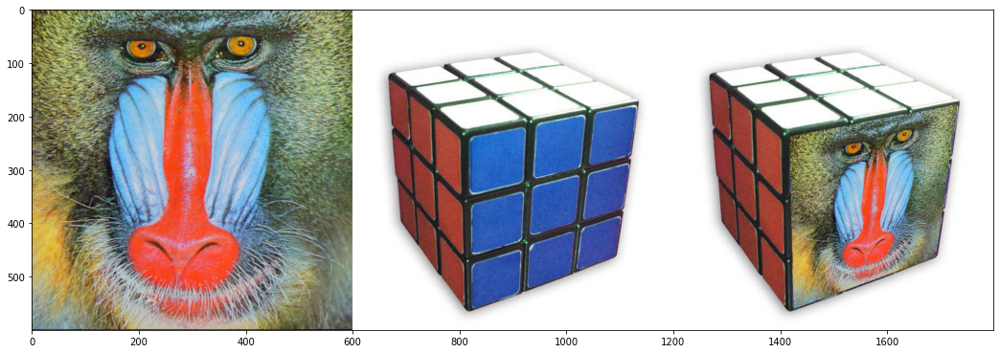

In [99]:
def binary_mask(img):
  '''Create a binary mask of the image content.
   Input:
    img: source image, shape (m, n, 3)
   Output:
    mask: image of shape (m, n) and type 'int'. For pixel [i, j] of mask, 
      if pixel [i, j] in img is nonzero in any channel, assign 1 to mask[i, j]. 
      Else, assign 0 to mask[i, j].
  '''
  mask = (img[:, :, 0] > 0) | (img[:, :, 1] > 0) | (img[:, :, 2] > 0)
  mask = mask.astype("int")
  return mask

def test_warp():

  src_img = load_image('mandrill.tif')
  canvas_img = load_image('Rubiks_cube.jpg')

  # The following are corners of the mandrill image
  src_pts = np.matrix('0, 0; 0, 511; 511, 511; 511, 0')
  # The following are corners of the blue face of the Rubik's cube
  canvas_pts = np.matrix('218, 238; 225, 560; 490, 463; 530, 178')

  # The following was used during debugging
  # print(canvas_pts)
  # test_x=218
  # test_y=238
  # cv2.circle(canvas_img, (218, 238), 4, (255, 0, 0), thickness=10)

  H = compute_homography(src_pts, canvas_pts)
  dst_img = warp_img(src_img, H, [canvas_img.shape[0], canvas_img.shape[1]])

  dst_mask = 1 - binary_mask(dst_img)
  dst_mask = np.stack((dst_mask,) * 3, -1)
  out_img = np.multiply(canvas_img, dst_mask) + dst_img
  
  dsize = (600, 600) # width and height of canvas_im
  src_smaller = cv2.resize(src_img, dsize, interpolation=cv2.INTER_AREA)
  
  warped_img = np.concatenate((src_smaller, canvas_img, out_img), axis=1)
  show_image(np.clip(warped_img, 0, 1))

test_warp()

#Part (c) RANSAC using SIFT keypoints

You have already confirmed that you can detect SIFT-based keypoints. Next, verify that you can use a matching technique from OpenCV that tries to detect corresponding keypoints between 2 images. The code should display the correspondences and draw lines between them.

By the way, cv2.BFmatcher() is OpenCV's "brute force" matcher. More description is given in 
https://github.com/abidrahmank/OpenCV2-Python-Tutorials/blob/master/source/py_tutorials/py_feature2d/py_matcher/py_matcher.rst

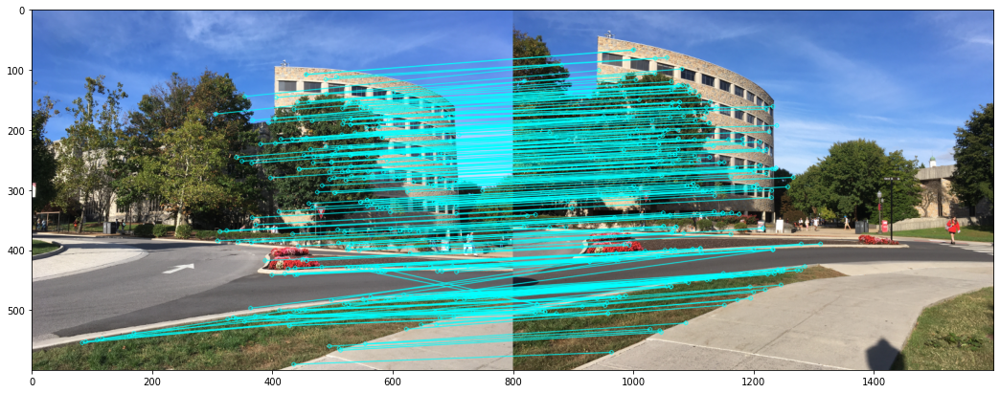

In [73]:
def genSIFTMatchPairs(img1, img2):
  sift = cv2.SIFT_create()
  #kp = sift.detect(img1, None)
  #kp = cv2.SIFT(edgeThreshold=10)
  kp1, des1 = sift.detectAndCompute(img1, None)
  kp2, des2 = sift.detectAndCompute(img2, None)
  bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
  matches = bf.match(des1, des2)
  matches = sorted(matches, key = lambda x:x.distance)

  pts1 = np.zeros((250, 2))
  pts2 = np.zeros((250, 2))
  for i in range(250):
    pts1[i,:] = kp1[matches[i].queryIdx].pt
    pts2[i,:] = kp2[matches[i].trainIdx].pt

  return pts1, pts2, matches[:250], kp1, kp2

def test_matches():
  img1 = cv2.imread('Newman1.png')
  img2 = cv2.imread('Newman3.png')
  pts1, pts2, matches1to2, kp1, kp2 = genSIFTMatchPairs(img1, img2)

  # In the following, parameter flags=2 will remove unmatched points from the display
  matching_result = cv2.drawMatches(img1, kp1, img2, kp2, matches1to2, None, flags=2,
    matchColor = (255, 255, 0), singlePointColor=(0, 0, 255))
  
  fig = plt.figure()
  fig.set_size_inches(18,10) # You can adjust the size of the displayed figure
  plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))


test_matches()

Notice that some of the matches from the previous step are not correct. It is possible that those false matches could act as outliers in your homography estimation. In that case we would expect a poor result in any composite image that we create. 

As discussed during lectures, the RANSAC algorithm is a popular way to deal with outliers during model fitting. Here you must implement your own function that uses the RANSAC approach to compute a homography H. 

In [76]:
def RANSAC(Xs, Xd, max_iter, eps):
  '''Find correspondences between two sets of points using the RANSAC algorithm.
   Input:
    Xs: the first set of points (source), shape [n, 2]
    Xd: the second set of points (destination) matched to the first set, shape [n, 2] 
    max_iter: max number of iterations that RANSAC should perform
    eps: tolerance of RANSAC
   Output:
    inliers_id: the indices of matched pairs when using the homography given by RANSAC
    H: the computed homography, shape [3, 3]

   TO DO: Implement the RANSAC function.
  '''
  H = np.zeros([3,3])

  
  inliers_id1 = []
  inliers_count = []

  for k in range(max_iter):
    inliers_id = []
    xs_random =[]
    xd_random = []
    sample_index = np.random.choice(Xs.shape[0],(4), replace=False)

    for i in range(0, len(sample_index)):
      xs_random.append(list(Xs[sample_index[i]]))
      xd_random.append(list(Xd[sample_index[i]]))
    xs_random = np.asarray(xs_random)
    xd_random = np.asarray(xd_random)
    H = compute_homography(xs_random, xd_random)
    match_pts = apply_homography(Xs, H)

    for i in range(0, len(Xd)):
      dist_square = (round(match_pts[i][0]) -int(Xd[i][0]))**2 +(round(match_pts[i][1]) - int(Xd[i][1]))**2
      if ((dist_square)<eps):
        inliers_id.append(i)
    inliers_id1.append(inliers_id)
    inliers_count.append(len(inliers_id))
  
  largest_inlier_count_index = inliers_count.index(max(inliers_count))
  max_inliers_id =inliers_id1[largest_inlier_count_index]

  Xs_inliers = []
  Xd_inliers = []

  for i in max_inliers_id:
    Xs_inliers.append(Xs[i][:])
    Xd_inliers.append(Xd[i][:])

  Xs_inliers = np.asarray(Xs_inliers)
  Xd_inliers = np.asarray(Xd_inliers)

  H = compute_homography(Xs_inliers, Xd_inliers)

  inliers_id = max_inliers_id.copy()
  print(len(max_inliers_id))

  return inliers_id, H


Now we can look at the matches between keypoints after using your RANSAC implementation. You do not need to modify the code in the next block. If you implemented RANSAC correctly, hopefully all of the incorrect matches have been discarded in the following output.

227


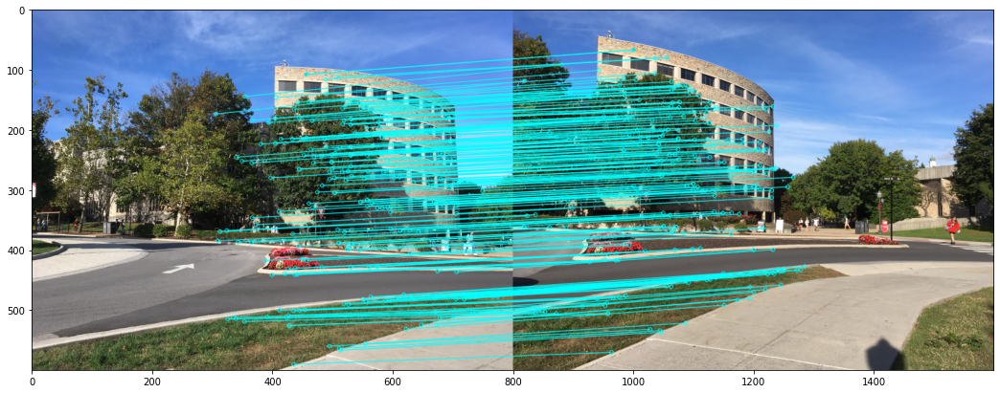

In [77]:
def test_ransac():
  img1 = cv2.imread('Newman1.png')
  img2 = cv2.imread('Newman3.png')
  pts1, pts2, matches1to2, kp1, kp2 = genSIFTMatchPairs(img1, img2)
  
  inliers_idx, H = RANSAC(pts1, pts2, 500, 50)
  new_matches = []
  for i in range(len(inliers_idx)):
    new_matches.append(matches1to2[inliers_idx[i]])

  matching_result = cv2.drawMatches(img1, kp1, img2, kp2, new_matches, None, flags=2, 
                                    matchColor = (255, 255, 0), singlePointColor=(0, 0, 255))

  fig = plt.figure()
  fig.set_size_inches(18, 10) # You can adjust the size of the displayed figure
  plt.imshow(cv2.cvtColor(matching_result, cv2.COLOR_BGR2RGB))

test_ransac()

#Part (d):  Image stitching.

We are now ready to create a panorama from the three images that were shown at the beginning. The stitch_img() function below receives a Python list of images, which the code should stitch together to form one large image.
You must use the functions that you have written to create the panorama. 

We do not expect the result to be perfect, partly because some lens distortion is always present and it will prevent the homography from aligning things perfectly. However, for full credit, try to write code that will stitch the images together with very little noticable seam.

In [100]:

def stitch_img(imgs):
  '''Stitch a list of images together.
   Input:
    imgs: a list of images.
   Output:
    stitched_img: a single stiched image.
  
   TO DO: implement the stitch_img function.
  '''
  # the following line is just a placeholder
  img0 = imgs[0]
  img1 = imgs[1]
  img2 = imgs[2]

  img0 = np.pad(img0, pad_width=((400,400), (400,400), (0,0)))

  pts1, pts2, matches1to2, kp1, kp2 = genSIFTMatchPairs(img1, img0)
  inliers_idx, H = RANSAC(pts1, pts2, 500, 50)
  
  pts2, pts3, matches1to2, kp1, kp2 = genSIFTMatchPairs(img2, img0)
  inliers_idx, H1 = RANSAC(pts2, pts3, 500, 50)
  
  dst_img = warp_img(img1, H, [img0.shape[0], img0.shape[1]])

  
  dst_mask = 1 - binary_mask(dst_img)
  dst_mask = np.stack((dst_mask,) * 3, -1)
  out_img = np.multiply(img0, dst_mask) + dst_img


  dst_img1 = warp_img(img2, H1, [out_img.shape[0], out_img.shape[1]])


  dst_mask1 = 1 - binary_mask(dst_img1)
  dst_mask1 = np.stack((dst_mask1,) * 3, -1)
  out_img1 = np.multiply(out_img, dst_mask1) + dst_img1
  


  return out_img1


Use the following code to test your implementation. This code just reads in the images, calls your stitch_img() function, and plots the results.


242
242


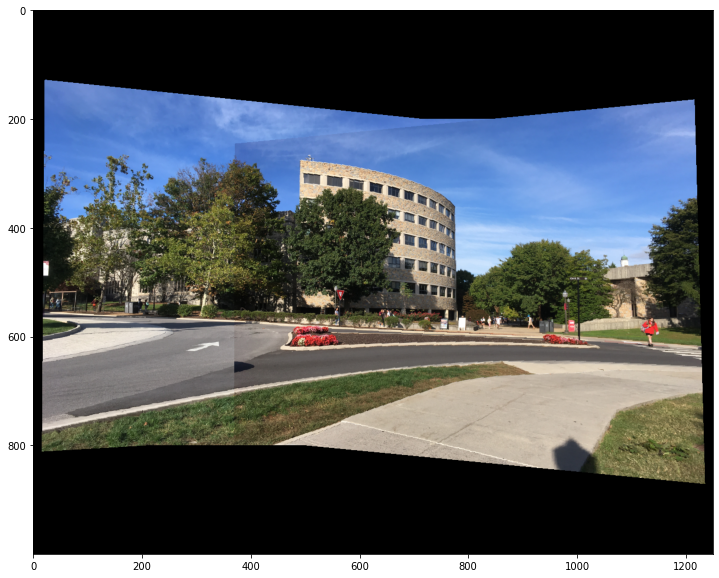

In [101]:
left_img = cv2.imread("Newman1.png")
center_img = cv2.imread("Newman2.png")
right_img = cv2.imread("Newman3.png")

final_img = stitch_img([center_img, left_img, right_img])
final_img = final_img[200:final_img.shape[0]-200, 200:final_img.shape[1]-150]
fig = plt.figure()
fig.set_size_inches(25,10) # You can adjust the size of the displayed figure
plt.imshow(cv2.cvtColor(final_img.astype("uint8"), cv2.COLOR_BGR2RGB))


Finally, use 3 or more photos of your own to create a panorama. It is suggested that you take new photos using your camera (e.g., with your phone or laptop). Remember to stand in place and try to rotate the camera about its point of projection. (If the camera position changes, then the transformation between 2 images is no longer a homography.)

**Please include these new photos as part of your HW3 submission.** We would like to select the best panoramas (as decided by the graders) to show during a lecture. (If you prefer that we do not show your photos to the class, that is fine. In that case, please tell us using a comment at the top of the following code block.) To reduce computation time, it is acceptable to resize your images down to a smaller size before processing them. You could consider using `cv2.resize()` for that purpose. For example, the provided Newman Library images were reduced to 800x600 from much larger dimensions.



241
237


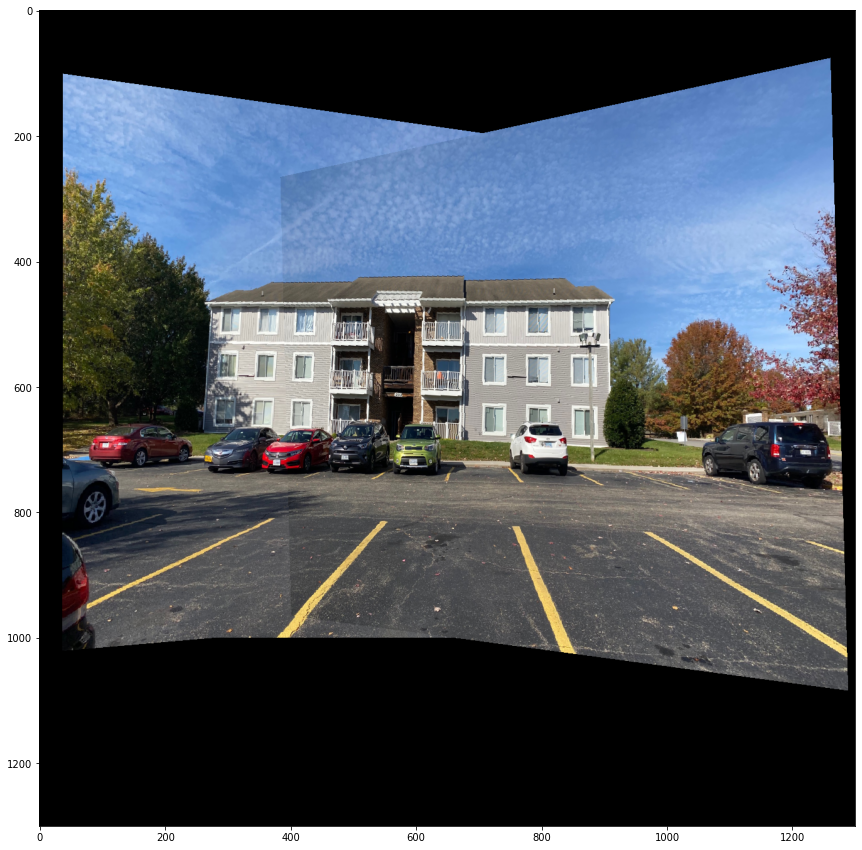

In [94]:
# TO DO: Load your own images here and create a panorama. 
left_img = cv2.imread("left_img.JPG")
center_img = cv2.imread("center_img.JPG")
right_img = cv2.imread("right_img.JPG")

# print(left_img)


left_img = cv2.resize(left_img, (800,800), interpolation=cv2.INTER_AREA)
center_img = cv2.resize(center_img, (800,800), interpolation=cv2.INTER_AREA)
right_img = cv2.resize(right_img,(800,800), interpolation=cv2.INTER_AREA)

final_img = stitch_img([center_img, left_img, right_img])
final_img = final_img[200:final_img.shape[0]-100, 200:final_img.shape[1]-100]
fig = plt.figure()
fig.set_size_inches(20,15) # You can adjust the size of the displayed figure
plt.imshow(cv2.cvtColor(final_img.astype("uint8"), cv2.COLOR_BGR2RGB))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: DeprecationWarning: The Python built-in `round` is deprecated for complex scalars, and will raise a `TypeError` in a future release. Use `np.round` or `scalar.round` instead.


250
242


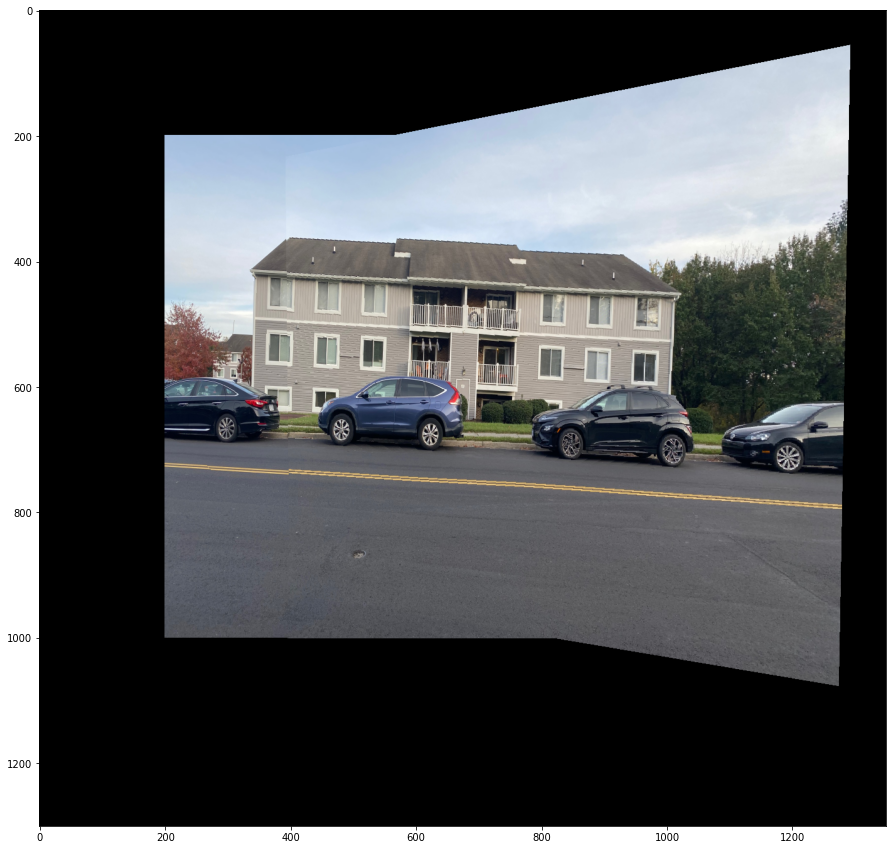

In [97]:
# TO DO: Load your own images here and create a panorama. 
left_img = cv2.imread("Left1.JPG")
center_img = cv2.imread("Center1.JPG")
right_img = cv2.imread("Right1.JPG")

# print(left_img)


left_img = cv2.resize(left_img, (800,800), interpolation=cv2.INTER_AREA)
center_img = cv2.resize(center_img, (800,800), interpolation=cv2.INTER_AREA)
right_img = cv2.resize(right_img,(800,800), interpolation=cv2.INTER_AREA)

final_img = stitch_img([center_img, left_img, right_img])
final_img = final_img[200:final_img.shape[0]-100, 200:final_img.shape[1]-50]
fig = plt.figure()
fig.set_size_inches(20,15) # You can adjust the size of the displayed figure
plt.imshow(cv2.cvtColor(final_img.astype("uint8"), cv2.COLOR_BGR2RGB))

**QUESTION 5:**

**SIFT** **VS ORB** 


**SIFT:**

The scale-invariant feature transform (SIFT) is an algorithm to detect, describe, and match local features in images. The major merits of SIFT are its scale and rotational invariance. The algorithm is popularly used as it is relatively accurate.

The major disadvantage of SIFT is that the SIFT is based on the Histogram of Gradients. The gradients of each Pixel in the patch should be computed and these computations cost time. Also, SIFT doesn't work really well with lighting changes and blur.

**ORB**

Oriented FAST and rotated BRIEF (ORB) is an algorithm to detect, describe, and match local features in images. It is uses FAST key point detector and modified version of BRIEF descriptor.

The major advantage of ORB is that it is computationally very fast with very good accuracy. Disadvantage of ORB is that it's performance is not highly invariant to scaling.




**SIFT DETECTION AND ORB DETECTION - IMPLEMENTATION**

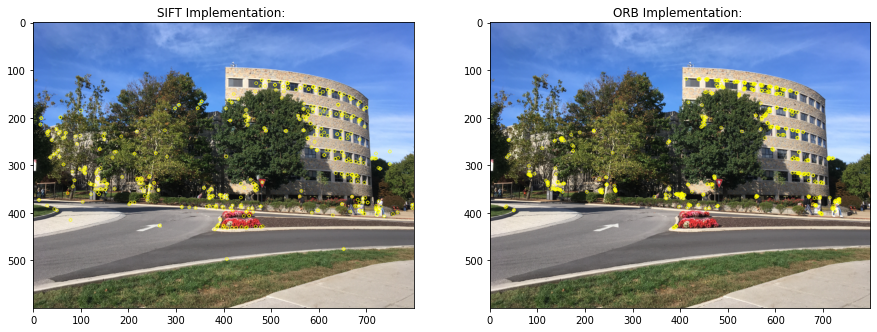

In [110]:
img =  cv2.imread("Newman1.png", cv2.IMREAD_COLOR)

sift = cv2.SIFT_create(nfeatures = 500)
kp = sift.detect(img, None)
test_sift = cv2.drawKeypoints(img, kp, None, color = (0, 255, 255))

fig = plt.figure()
fig.add_subplot(1,2,1)
fig.set_size_inches(15,10)
plt.title("SIFT Implementation: ")
plt.imshow(cv2.cvtColor(test_sift, cv2.COLOR_BGR2RGB))

img =  cv2.imread("Newman1.png", cv2.IMREAD_COLOR)

sift = cv2.ORB_create(nfeatures = 500)
kp = sift.detect(img, None)
test_sift = cv2.drawKeypoints(img, kp, None, color = (0, 255, 255))

fig.add_subplot(1,2,2)
fig.set_size_inches(15,10)
plt.title("ORB Implementation: ")
plt.imshow(cv2.cvtColor(test_sift, cv2.COLOR_BGR2RGB))



**ORB VS SIFT COMPUTATION TIME COMPARISON**

Oriented FAST and rotated BRIEF (ORB) is computationally much faster than SIFT algorithm. ORB uses a template based corner detector that is known as FAST. In FAST corner detector, a decision tree is used to determine the order of pixels. Using a decision tree to determine a point as a corner accelerates the processing time. Thus ORB works really fast.

SIFT uses DoG pyramid and Hessian Matrix. Working with the DoG is time consuming. Thus SIFT is more time consuming than SIFT as working with Difference of Gaussian is more time consuming than working with decision trees.

Computation time of SIFT Algorithm 0.3591792583465576 s
Computation time of ORB Algorithm 0.01965785026550293 s
ORB is faster than SIFT by 0.3395214080810547 s


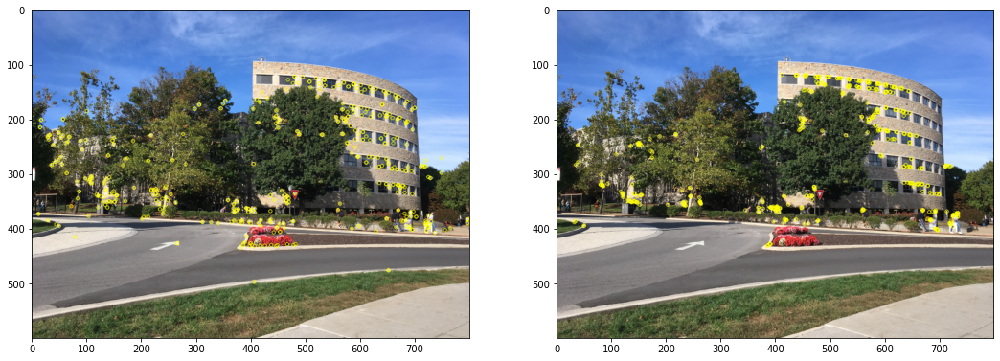

In [106]:
import time

test_img = cv2.imread("Newman1.png", cv2.IMREAD_COLOR)

start_sift = time.time()
sift = cv2.SIFT_create(nfeatures=500)
kp = sift.detect(test_img, None)
test_sift=cv2.drawKeypoints(test_img, kp, None, color=(0, 255, 255))
stop_sift = time.time()
time_sift = stop_sift - start_sift
print("Computation time of SIFT Algorithm {0} s".format(time_sift))

start_orb = time.time()
orb = cv2.ORB_create(nfeatures=500)
kp = orb.detect(test_img, None)
test_orb=cv2.drawKeypoints(test_img, kp, None, color=(0, 255, 255))
stop_orb = time.time()
time_orb = stop_orb - start_orb
print("Computation time of ORB Algorithm {0} s".format(time_orb))
print("ORB is faster than SIFT by {0} s".format(time_sift-time_orb))
fig = plt.figure()
fig.add_subplot(1,2,1)
fig.set_size_inches(15,10) 
plt.imshow(cv2.cvtColor(test_sift, cv2.COLOR_BGR2RGB))

fig.add_subplot(1,2,2)
fig.set_size_inches(18,10) 
plt.imshow(cv2.cvtColor(test_orb, cv2.COLOR_BGR2RGB))


**ORB vs SIFT Rotation Comparison**

In this case, SIFT and ORB was applied to a un rotated image and rotated image. The detected keypoints between the images were matched with Brute Force Matcher and the number of good matches between a un rotated image and rotated image was found out when using SIFT and ORB feature detectors respectively using ratio test.

**Rotation by 45 Degrees**

SIFT performes better than ORB when the image is rotated by 45 degrees. This is illustrated in the code blocks below. The number of good matches while performing SIFT based feature detection between un rotated and rotated image (45 degrees) is 334. The number of good matches while performing ORB based feature detection between un rotated and rotated image (by 45 degrees) is 213.

Thus SIFT detector clearly performs better than ORB when the image is rotated by 45 degrees.

**Rotation by 90 Degrees**

Both SIFT and ORB perform equally well when the image is rotated by 90 degrees. This is illustrated in code blocks following the code blocks illustrating 45 degree rotation. The number of good matches while performing SIFT based feature detection between un rotated and rotated image (by 90 degrees) is 468. The number of good matches while performing ORB based feature detection between un rotated and rotated image (by 90 degrees) is 500.

ORB performs slightly better than SIFT when rotated by 90 degrees but the performance variation is very minimal. Thus the performance of ORB and SIFT when the image is rotated by 90 degrees can be considered as similar.



**ORB VS SIFT ROTATION by 45 degrees comparison**

**ORB Rotation by 45 degrees**

Number of key points in Image1:  500
Number of key points in Image2:  500
Number of Good Matches:  213
ORB Detector with un rotated Image:


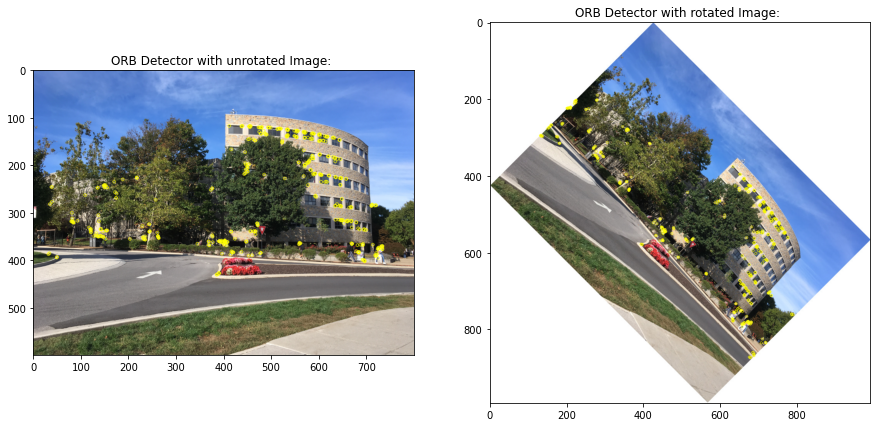

In [111]:
img1 = cv2.imread('Newman1.png')
#img2 = cv2.GaussianBlur(img1,(5,5),cv2.BORDER_DEFAULT)
img2 = cv2.imread('Newman3.jpg')
# Initiate ORB detector
orb = cv2.ORB_create(nfeatures = 500)


# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

# no.of keypoints 
print("Number of key points in Image1: ",len(des1))
print("Number of key points in Image2: ",len(des2))

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Create images with keypoints
img1=cv2.drawKeypoints(img1,kp1,img1, color = (0, 255, 255))
img2=cv2.drawKeypoints(img2,kp2,img2, color = (0, 255, 255))


# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])

#print("matches ")
print("Number of Good Matches: ", len(good))
print("ORB Detector with un rotated Image:")
fig = plt.figure()
fig.add_subplot(1,2,1)
fig.set_size_inches(15,10)
plt.title("ORB Detector with unrotated Image: ")
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
# cv2_imshow(img1)
fig.add_subplot(1,2,2)
fig.set_size_inches(15,10)
plt.title("ORB Detector with rotated Image: ")
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
# cv2_imshow(img2)


**SIFT Rotation by 45 degrees**

Number of key points in Image1:  500
Number of key points in Image2:  500
Number of Good Matches:  334


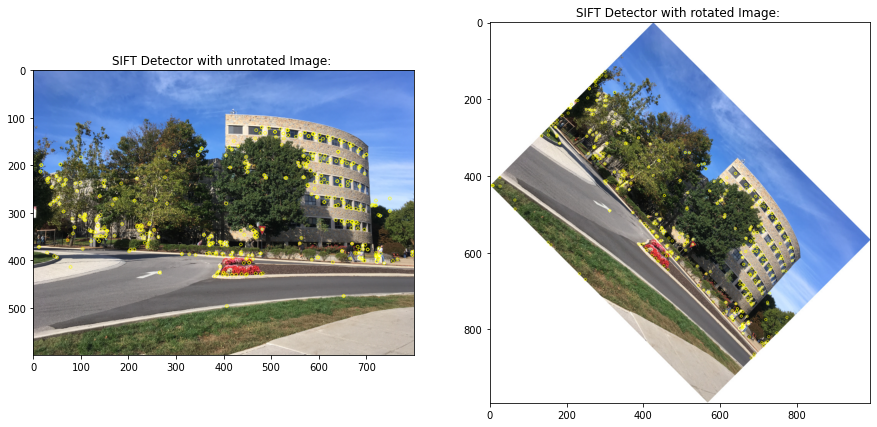

In [113]:
img1 = cv2.imread('Newman1.png')
#img2 = cv2.GaussianBlur(img1,(5,5),cv2.BORDER_DEFAULT)
img2 = cv2.imread('Newman3.jpg')
# Initiate ORB detector
sift = cv2.SIFT_create(nfeatures = 500)

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# no.of keypoints 
print("Number of key points in Image1: ",len(des1))
print("Number of key points in Image2: ",len(des2))

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Create images with keypoints
img1=cv2.drawKeypoints(img1,kp1,img1, color = (0, 255, 255))
img2=cv2.drawKeypoints(img2,kp2,img2, color = (0, 255, 255))


# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])

#print("matches ")
print("Number of Good Matches: ", len(good))

fig = plt.figure()
fig.add_subplot(1,2,1)
fig.set_size_inches(15,10)
plt.title("SIFT Detector with unrotated Image: ")
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
# cv2_imshow(img1)
fig.add_subplot(1,2,2)
fig.set_size_inches(15,10)
plt.title("SIFT Detector with rotated Image: ")
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
# cv2_imshow(img2)

**SIFT Rotation by 90 degrees**


Number of key points in Image1:  500
Number of key points in Image2:  501
Number of Good Matches:  468


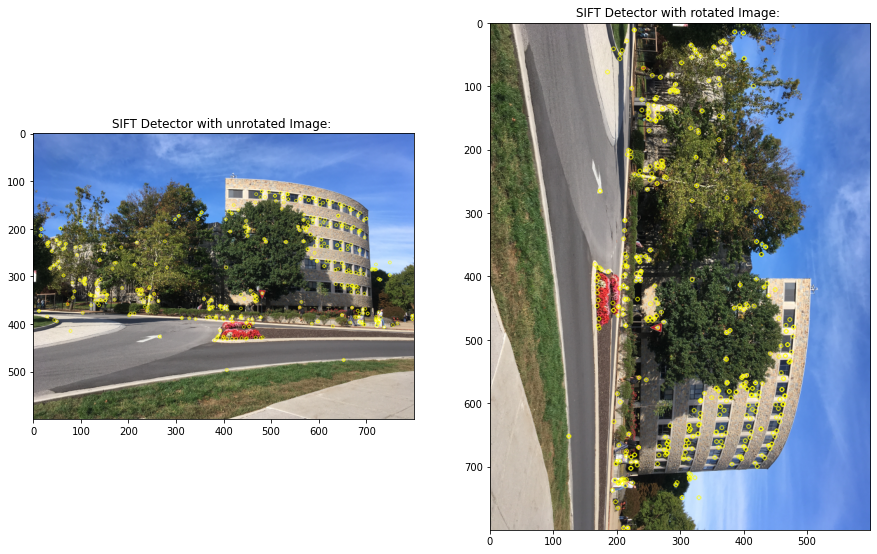

In [114]:
img1 = cv2.imread("Newman1.png", cv2.IMREAD_COLOR)
img2 = cv2.rotate(test_img, cv2.cv2.ROTATE_90_CLOCKWISE)

sift = cv2.SIFT_create(nfeatures = 500)

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# no.of keypoints 
print("Number of key points in Image1: ",len(des1))
print("Number of key points in Image2: ",len(des2))

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Create images with keypoints
img1=cv2.drawKeypoints(img1,kp1,img1, color = (0, 255, 255))
img2=cv2.drawKeypoints(img2,kp2,img2, color = (0, 255, 255))


# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])

#print("matches ")
print("Number of Good Matches: ", len(good))

fig = plt.figure()
fig.add_subplot(1,2,1)
fig.set_size_inches(15,10)
plt.title("SIFT Detector with unrotated Image: ")
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
# cv2_imshow(img1)
fig.add_subplot(1,2,2)
fig.set_size_inches(15,10)
plt.title("SIFT Detector with rotated Image: ")
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
# cv2_imshow(img2)

**ORB Rotation by 90 degrees**

Number of key points in Image1:  500
Number of key points in Image2:  500
Number of Good Matches:  500


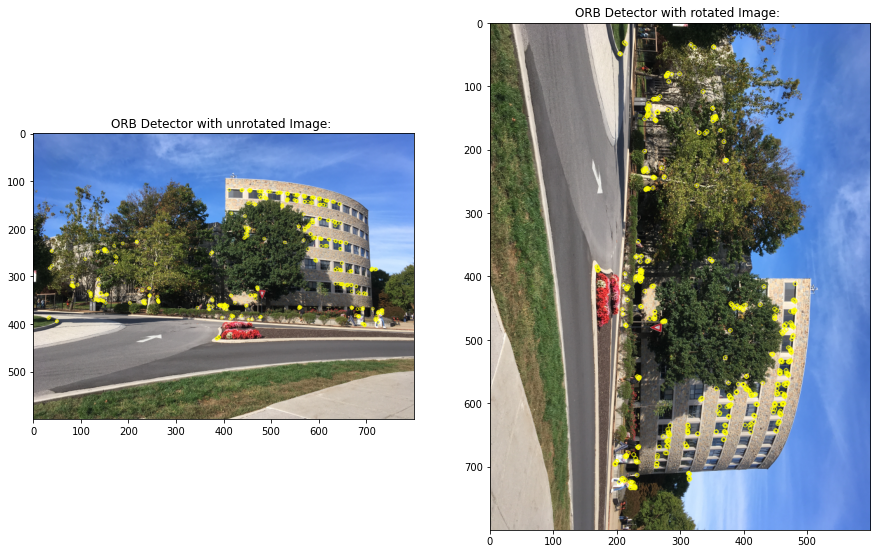

In [116]:
img1 = cv2.imread("Newman1.png", cv2.IMREAD_COLOR)
img2 = cv2.rotate(test_img, cv2.cv2.ROTATE_90_CLOCKWISE)

orb = cv2.ORB_create(nfeatures = 500)


# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

# no.of keypoints 
print("Number of key points in Image1: ",len(des1))
print("Number of key points in Image2: ",len(des2))

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Create images with keypoints
img1=cv2.drawKeypoints(img1,kp1,img1, color = (0, 255, 255))
img2=cv2.drawKeypoints(img2,kp2,img2, color = (0, 255, 255))


# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])

#print("matches ")
print("Number of Good Matches: ", len(good))

fig = plt.figure()
fig.add_subplot(1,2,1)
fig.set_size_inches(15,10)
plt.title("ORB Detector with unrotated Image: ")
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
# cv2_imshow(img1)
fig.add_subplot(1,2,2)
fig.set_size_inches(15,10)
plt.title("ORB Detector with rotated Image: ")
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
# cv2_imshow(img2)

**ORB vs SIFT SCALE INVARIANCE**

In this case, SIFT and ORB was applied to a unscaled image and scaled image. The detected keypoints between the images were matched with Brute Force Matcher and the number of good matches between a unscaled image and scaled image was found out when using SIFT and ORB feature detectors respectively.

SIFT is comparatively more robust to scaling than ORB. The number of good matches between unscaled image and scaled image while applying ORB feature detector was found out to be 91. The number of good matches between unscaled image and scaled image while applying SIFT feature detector was found out to be 255.

Thus SIFT is comparatively more robust to scaling when compared to ORB. As per the theory SIFT is Scale Invariant while the robustness of ORB to scaling cannot be determined with this single example. A more detailed study with a lot of examples has to be done to determine ORB's robustness with respect to scaling.

**ORB SCALE INVARIANCE**

Number of key points in Image1:  500
Number of key points in Image2:  500
Number of Good Matches:  91


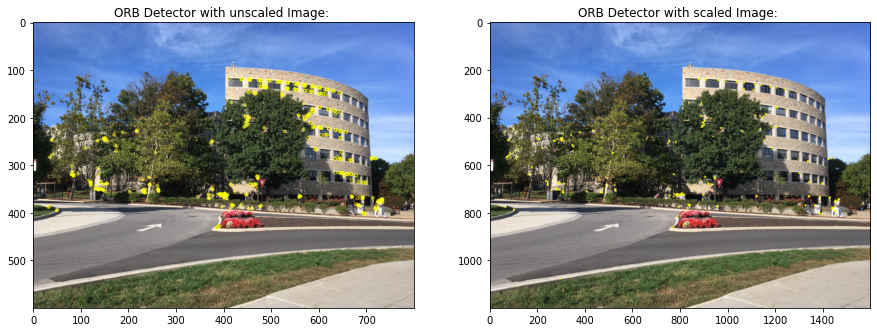

In [117]:
img1 = cv2.imread("Newman1.png", cv2.IMREAD_COLOR)
img2 = cv2.resize(img1, (img1.shape[1]*2, img1.shape[0]*2), interpolation=cv2.INTER_AREA )

orb = cv2.ORB_create(nfeatures = 500)


# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

# no.of keypoints 
print("Number of key points in Image1: ",len(des1))
print("Number of key points in Image2: ",len(des2))

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Create images with keypoints
img1=cv2.drawKeypoints(img1,kp1,img1, color = (0, 255, 255))
img2=cv2.drawKeypoints(img2,kp2,img2, color = (0, 255, 255))


# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])


print("Number of Good Matches: ", len(good))

fig = plt.figure()
fig.add_subplot(1,2,1)
fig.set_size_inches(15,10)
plt.title("ORB Detector with unscaled Image: ")
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
# cv2_imshow(img1)
fig.add_subplot(1,2,2)
fig.set_size_inches(15,10)
plt.title("ORB Detector with scaled Image: ")
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
# cv2_imshow(img2)

**SIFT SCALE INVARIANCE**

Number of key points in Image1:  500
Number of key points in Image2:  500
Number of Good Matches:  255


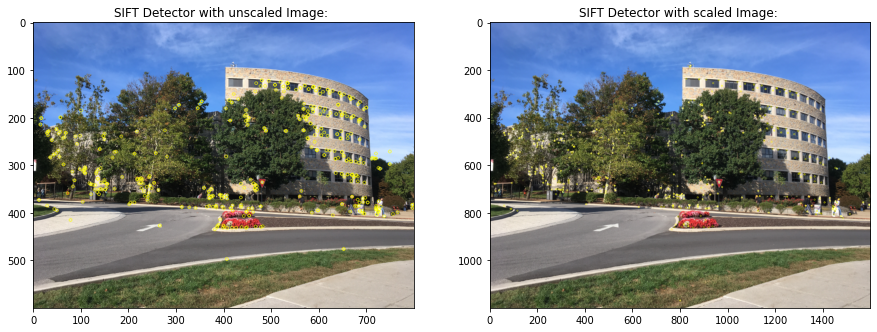

In [119]:
img1 = cv2.imread("Newman1.png", cv2.IMREAD_COLOR)
img2 = cv2.resize(img1, (img1.shape[1]*2, img1.shape[0]*2), interpolation=cv2.INTER_AREA )

sift = cv2.SIFT_create(nfeatures = 500)


# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# no.of keypoints 
print("Number of key points in Image1: ",len(des1))
print("Number of key points in Image2: ",len(des2))

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Create images with keypoints
img1=cv2.drawKeypoints(img1,kp1,img1, color = (0, 255, 255))
img2=cv2.drawKeypoints(img2,kp2,img2, color = (0, 255, 255))


# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.8*n.distance:
        good.append([m])

#print("matches ")
print("Number of Good Matches: ", len(good))

fig = plt.figure()
fig.add_subplot(1,2,1)
fig.set_size_inches(15,10)
plt.title("SIFT Detector with unscaled Image: ")
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
# cv2_imshow(img1)
fig.add_subplot(1,2,2)
fig.set_size_inches(15,10)
plt.title("SIFT Detector with scaled Image: ")
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
# cv2_imshow(img2)

---
# Creating a PDF version of your current notebook

In [102]:
#The following two installation steps are needed to generate a PDF version of the notebook
#(These lines are needed within Google Colab, but are not needed within a local version of Jupyter notebook)
!apt-get -qq install texlive texlive-xetex texlive-latex-extra pandoc 
!pip install --quiet pypandoc

Extracting templates from packages: 100%
Preconfiguring packages ...
Selecting previously unselected package fonts-droid-fallback.
(Reading database ... 155219 files and directories currently installed.)
Preparing to unpack .../00-fonts-droid-fallback_1%3a6.0.1r16-1.1_all.deb ...
Unpacking fonts-droid-fallback (1:6.0.1r16-1.1) ...
Selecting previously unselected package fonts-lato.
Preparing to unpack .../01-fonts-lato_2.0-2_all.deb ...
Unpacking fonts-lato (2.0-2) ...
Selecting previously unselected package poppler-data.
Preparing to unpack .../02-poppler-data_0.4.8-2_all.deb ...
Unpacking poppler-data (0.4.8-2) ...
Selecting previously unselected package tex-common.
Preparing to unpack .../03-tex-common_6.09_all.deb ...
Unpacking tex-common (6.09) ...
Selecting previously unselected package fonts-lmodern.
Preparing to unpack .../04-fonts-lmodern_2.004.5-3_all.deb ...
Unpacking fonts-lmodern (2.004.5-3) ...
Selecting previously unselected package fonts-noto-mono.
Preparing to unpack .

In [120]:
# TO DO: Provide the full path to your Jupyter notebook file
!jupyter nbconvert --to PDF "/content/drive/MyDrive/ECE5554_Fall2021/Homework3/Homework3_gkaushik.ipynb"

[NbConvertApp] Converting notebook /content/drive/MyDrive/ECE5554_Fall2021/Homework3/Homework3_gkaushik.ipynb to PDF
[NbConvertApp] Support files will be in Homework3_gkaushik_files/
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaushik_files
[NbConvertApp] Making directory ./Homework3_gkaush